In [37]:
import os
import pathlib
import random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
import albumentations as A
import kagglehub

import tensorflow as tf

from object_detection.utils import config_util, label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline

### Example of Image

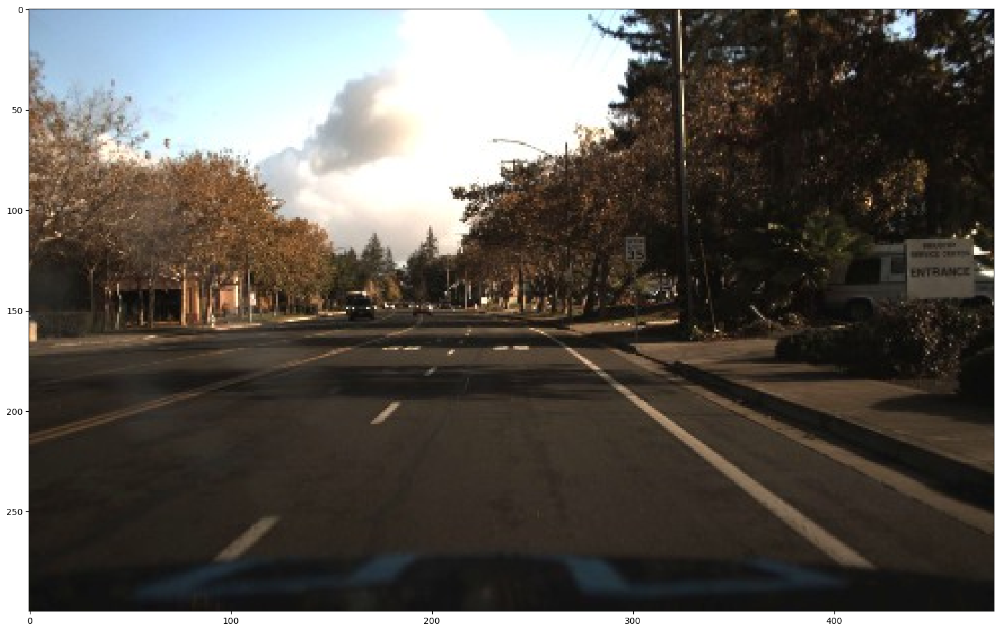

(300, 480, 3)


In [2]:
plt.figure(figsize=(20, 20))
img = cv2.imread('../data/interim/object_detection/images/1478019955185244088.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

print(img.shape)

## Preprocessing
---
Data directory contains the following:
* images/
* labels_train.csv
* labels_trainval.csv
* labels_val.csv

`classic_id labels`: 
1. 'car', 
2. 'truck', 
3. 'pedestrian', 
4. 'bicyclist', 
5. 'light'

In [2]:
df = pd.read_csv('../data/interim/object_detection/labels_train.csv')
df

,frame,xmin,xmax,ymin,ymax,class_id
0,1478019952686311006.jpg,237,251,143,155,1
1,1478019952686311006.jpg,437,454,120,186,3
2,1478019953180167674.jpg,218,231,146,158,1
3,1478019953689774621.jpg,171,182,141,154,2
4,1478019953689774621.jpg,179,191,144,155,1
...,...,...,...,...,...,...
132401,1479506176491553178.jpg,166,186,139,156,1
132402,1479506176491553178.jpg,182,204,142,153,1
132403,1479506176491553178.jpg,239,261,139,155,1
132404,1479506176491553178.jpg,259,280,139,157,1


In [3]:
# Save bounding boxes in a dictionary
gt_boxes={}
for index, row in df.iterrows():
    # Class=3: pedestrian
    if row['class_id'] == 3:
        # Bounding box normalized based on the dimensions of the image (300, 480)
        bbox = np.array([[
            row['ymin']/300, 
            row['xmin']/480, 
            row['ymax']/300, 
            row['xmax']/480
        ]], dtype=np.float32)
        # Aggregate the bounding box in case is different
        if row['frame'] in gt_boxes:
            gt_boxes[row['frame']] = np.append(gt_boxes[row['frame']], np.array(bbox), axis =0)
        else:
            gt_boxes[row['frame']] = np.array(bbox)

In [4]:
# Path of the images directory
images_path = '../data/interim/object_detection/images/'

# Read all the images
train_images_np = []
for image in gt_boxes.keys():
    im = cv2.imread(images_path + image)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    train_images_np.append(im)

### Dataset Viz

In [ ]:
# Focusing on a single class for this visualization test
# Pedestrians: 1
# Everythin else: 0
pedestrain_class_id = 1
num_classes = 1

# Dictionary to associate the id_class of a pedestrian with the string 'pedestrian'
category_index = {
    num_classes: {
        'id' : pedestrain_class_id,
        'name': 'pedestrian'
    }
}

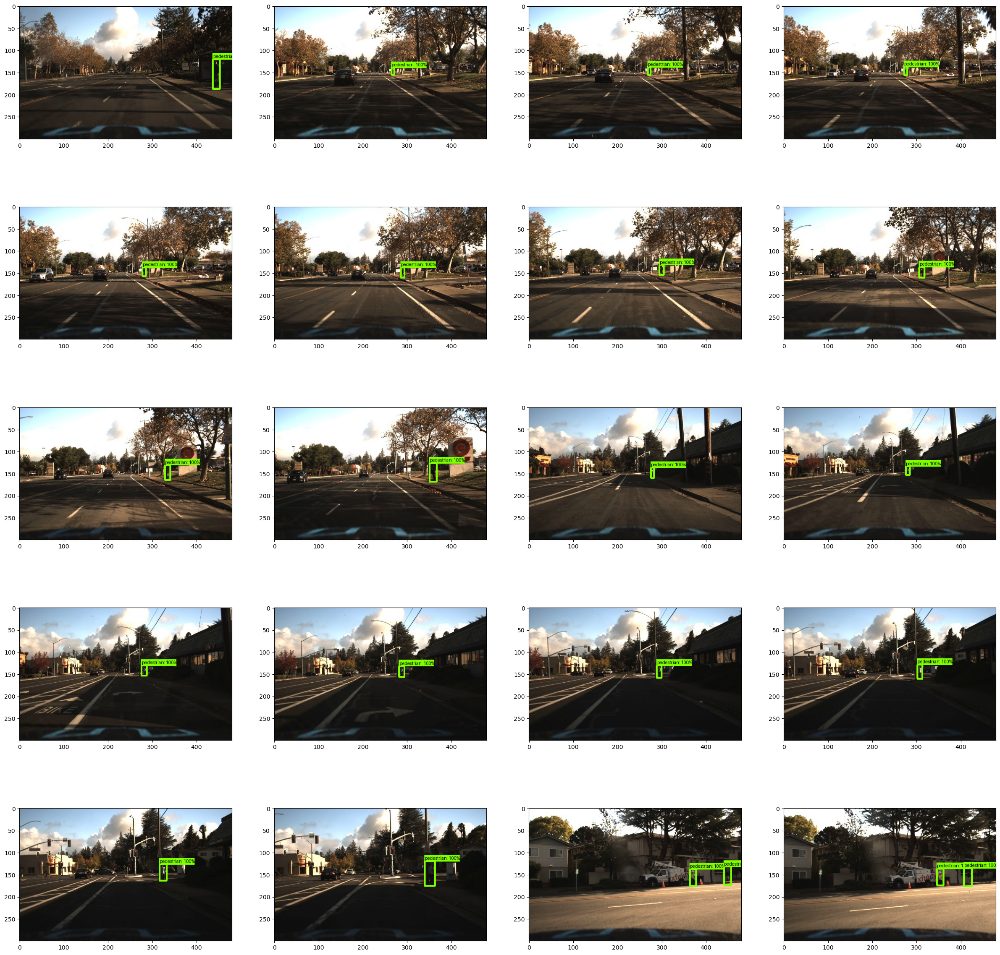

In [12]:
# Call object_detection module to create a function capable of visualize 
# bounding boxes with its prediction
def plot_detections(image_np, boxes, classes, scores, category_index):
    image_np_with_annotations = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_annotations,
        boxes, 
        classes, 
        scores, 
        category_index, 
        use_normalized_coordinates=True, 
        min_score_thresh=0.5
    )
    plt.imshow(image_np_with_annotations)

plt.figure(figsize=(30, 30))
for idx in range(0, 20):
    bboxes = list(gt_boxes.values())[idx]
    # Dummy variable to represent 100% confidance of detection
    dummy_scores = np.ones(shape=[bboxes.shape[0]], dtype=np.float32)
    plt.subplot(5, 4, idx+1)
    plot_detections(
        train_images_np[idx],
        bboxes, 
        np.ones(shape=[bboxes.shape[0]], dtype=np.int32), # Detections as category 1: pedestrians
        dummy_scores,
        category_index
    )
plt.show()

### Data Augmentation with `albumentations`

In [ ]:
# Load the transformations based on probabilities to be applied on the image
transforms = A.Compose(
    [
        A.HorizontalFlip(p=0.8), 
        A.RandomBrightnessContrast(p=0.8)
    ], 
    bbox_params=A.BboxParams(format='albumentations')
)

Example for one image

In [15]:
# Albumentation requires a change in the format of the bounding boxes
bbox = list(gt_boxes.values())[0][0]
print('Previous format', bbox)
# Rearrange the bounding boxes
bbox = [bbox[1], bbox[0], bbox[3], bbox[2]]
# Add the class
bbox.append('pedestrian')
# In some cases, a single image can contain more than one bounding box
bbox = [bbox]
print('Current format', bbox)

Previous format [0.4        0.91041666 0.62       0.9458333 ]
Current format [[0.91041666, 0.4, 0.9458333, 0.62, 'pedestrian']]


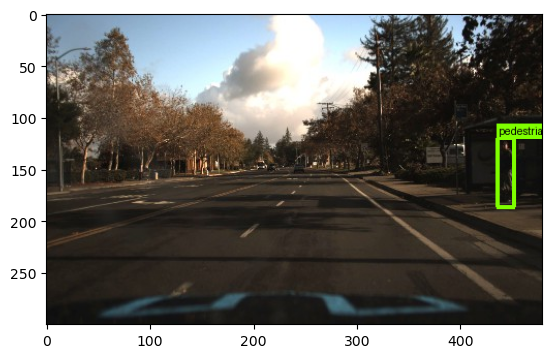

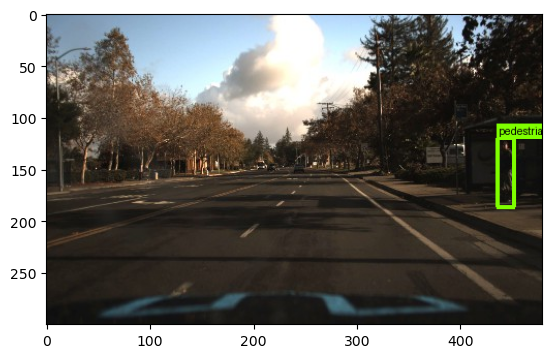

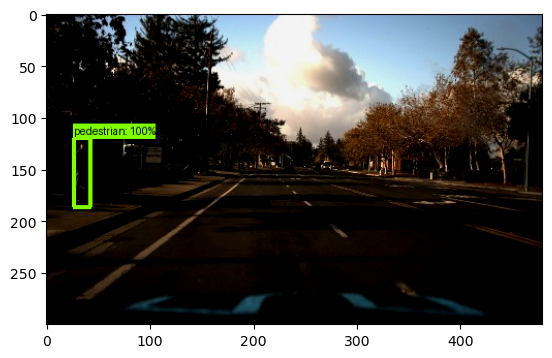

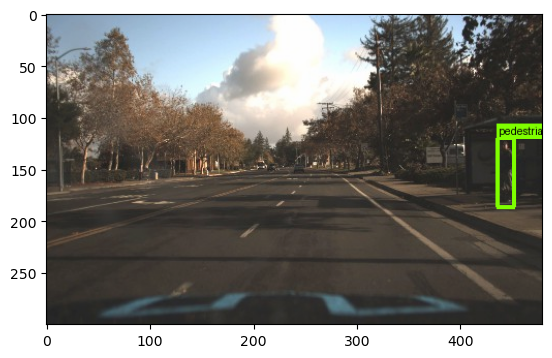

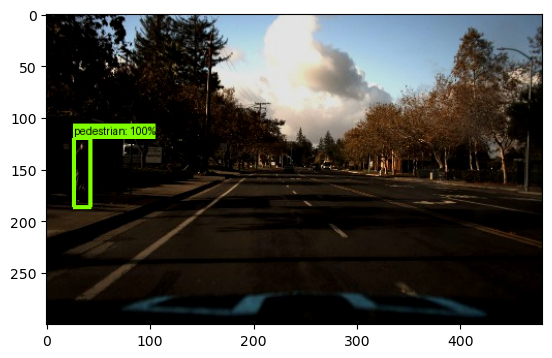

In [22]:
# Original Image
plt.figure()
plot_detections(
    train_images_np[0], 
    np.array([list(gt_boxes.values())[0][0]]),
    np.ones(shape=[1], dtype=np.int32),
    dummy_scores,
    category_index
)

# Augmented Images
num_iterations = 4
for i in range(num_iterations):
    # Transform the image
    trasformed_image = transforms(image=train_images_np[0], bboxes=bbox)
    # Transform the bounding box
    transformed_bbox = (list(trasformed_image['bboxes'][0])[:-1])
    transformed_bbox = [transformed_bbox[1], transformed_bbox[0], transformed_bbox[3], transformed_bbox[2]]
    
    plt.figure()
    plot_detections(
        trasformed_image['image'],
        np.array([transformed_bbox]),
        np.ones(shape=[1], dtype=np.int32),
        dummy_scores, 
        category_index
    )
    plt.show()

## Pre-Trained Model
---
The model that is capable of detection 90 different classes. But the dataset used only works with a few different classes.

In [36]:
# Get the routes of the pre-trained model architecture: ResNet50
model_name = 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8'
pipeline_config = os.path.join('../models/tf_models/research/object_detection/configs/tf2/' + model_name + '.config')
# Checkpoint of the pretrained model
model_dir = '../models/tf_models/research/object_detection/test_data/checkpoint/'

# Load a pretrained model from the object_detection module
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(model_config=model_config, is_training=False)
# Load checkpoints
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(os.path.join(model_dir, 'ckpt-0')).expect_partial()

In [38]:
# Auxiliary function for detections
def get_model_detection_function(model):
    # Decorator used to optimize the function's computation
    @tf.function
    def detect_fn(image):
        # Preprocess to make the image compatible with the model (ex. reshape)
        image, shape = model.preprocess(image)
        # Predictions of the image
        prediction_dict = model.predict(image, shape)
        # Final predictions
        detections = model.postprocess(prediction_dict, shape)
        return detections
    return detect_fn

detect_fn = get_model_detection_function(detection_model)

In [43]:
# Locate evaluations of the model and route of the Coco Dataset labels
label_map_path = configs['eval_input_config'].label_map_path
label_map_path = '../models/tf_models/research/object_detection/data/mscoco_label_map.pbtxt'

# Load labels from COCO Dataset
label_map = label_map_util.load_labelmap(label_map_path)
# Covert label to category
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True
)

# Category index
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

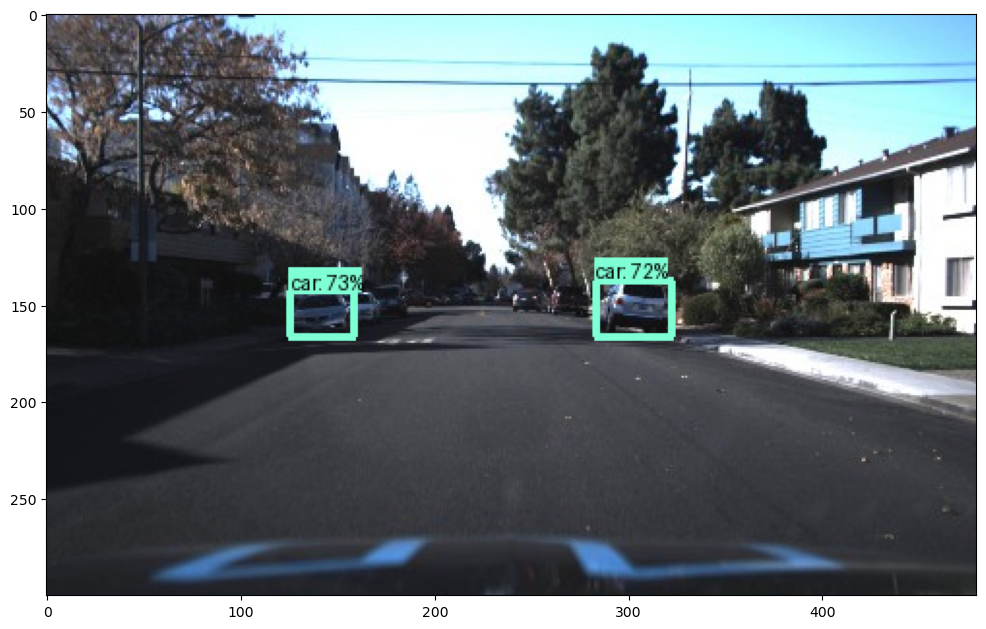

In [44]:
# Load an example image
img = cv2.imread('../data/interim/object_detection/images/1479506176491553178.jpg')
image_np = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Convert input image to tensor
input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32
)
# Use the model to get detections
detections = detect_fn(input_tensor)
# Class pedestrian, ignore class 0
label_id_offset = 1
image_np_with_detections = image_np.copy()

# Visualize predictions
viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections, # Image
    detections['detection_boxes'][0].numpy(), # Detections
    (detections['detection_classes'][0].numpy() + label_id_offset).astype(int), #Classes
    detections['detection_scores'][0].numpy(), # Scores of detections
    category_index, # Category index: 0, 1
    use_normalized_coordinates=True,
    min_score_thresh=0.7 # Threshold score
)

plt.figure(figsize=(12, 16))
plt.imshow(image_np_with_detections)
plt.show()

## Fine-Tuning the Model

In [47]:
# The model is capable of detection up to 90 classes, but this section 
# will focus again on the pedestrian section
num_classes = 1

# Get the routes of the pre-trained model architecture: ResNet50
model_name = 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8'
pipeline_config = os.path.join('../models/tf_models/research/object_detection/configs/tf2/' + model_name + '.config')
# Checkpoint of the pretrained model
model_dir = '../models/tf_models/research/object_detection/test_data/checkpoint/'
# Load a pretrained model from the object_detection module
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
### NOTE. Instead loading the regression and classification sections, only the regression
### section will be used. The classification will be tuned
# Focus on a single class
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
# Change is_training to True
detection_model = model_builder.build(model_config=model_config, is_training=True)

# Load checkpoints
### Only the regression part
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    _box_prediction_head=detection_model._box_predictor._box_prediction_head
)
fake_model = tf.compat.v2.train.Checkpoint(
    _feature_extractor=detection_model.feature_extractor,
    _box_predictor=fake_box_predictor
)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(os.path.join(model_dir, 'ckpt-0')).expect_partial()

# Create a dummy image (empty) to load the weights
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)

### Model load

In [52]:
# Load the train dataframe again to do the fine-tuning
df = pd.read_csv('../data/interim/object_detection/labels_train.csv')

# Save bounding boxes in a dictionary but only the images with pedestrians, the rest 
# will be ignored in this distionary
gt_boxes=[]
images_added = []
images_multi_bbox = set()
for index, row in df.iterrows():
    # Class=3: pedestrian, forget the other classes
    if row['frame'] not in images_added and row['class_id'] == 3:
        # Append the name of the image
        images_added.append(row['frame'])
        # Bounding box normalized based on the dimensions of the image (300, 480)
        bbox = np.array(
            [[
                row['ymin']/300, 
                row['xmin']/480, 
                row['ymax']/300, 
                row['xmax']/480
            ]], 
            dtype=np.float32)
        # Append bounding box
        gt_boxes.append(bbox)
    else:
        # If the image is repeated, append the image name for a later drop duplicate
        images_multi_bbox.add(row['frame'])

# Locate repeated id images
id_x_to_delete = []
for x, image in enumerate(images_added):
    if image in images_multi_bbox:
        id_x_to_delete.append(x)

# Delete repeated bounding boxes
new_gt_boxes = []
new_images_added = []
for x, gt_box in enumerate(gt_boxes):
    if x not in  id_x_to_delete:
        new_gt_boxes.append(gt_box)
# Delete repeated images with duplicates
for x, image_added in enumerate(images_added):
    if x not in id_x_to_delete:
        new_images_added.append(image_added)

# Reassing the cleaned images to the variables
gt_boxes = new_gt_boxes
images_added = new_images_added

### Data load

In [55]:
# Check the left images with the class 'pedestrian'
# This will make a faster training
my_path = '../data/interim/object_detection/images/'
train_images_np = []
print(len(images_added))
for image in images_added:
    im = cv2.imread(my_path+ image)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    train_images_np.append(im)

label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []
# Convert to tensors
for (train_image_np, gt_box_np) in zip(train_images_np, gt_boxes):
    # Image arrays
    train_image_tensors.append(
        tf.expand_dims(tf.convert_to_tensor(train_image_np, dtype=tf.float32), axis=0)
    )
    # Bbounding boxes
    gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
    
    # Class pedestrian: 1
    zero_indexed_ground_truth_classes = tf.convert_to_tensor(
        np.ones([gt_box_np.shape[0]], dtype=np.int32)-label_id_offset
    )
    # One-Hot encoding for the classes
    gt_classes_one_hot_tensors.append(
        tf.one_hot(zero_indexed_ground_truth_classes, num_classes)
    )

21


### Training

In [58]:
# Set the training phase to True
tf.keras.backend.set_learning_phase(True)

# Hyperparameters
batch_size = 10
learning_rate= 0.01
num_batches = 200

# Trainable variables
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
    'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
    'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead'                 
    ]
for var in trainable_variables:
    if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
        to_fine_tune.append(var)

/home/j-e-s-h/anaconda3/envs/objectdetection_cnn/lib/python3.9/site-packages/keras/src/backend.py:452: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn(


In [59]:
# Training step function
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
    # Decorator used to optimize the function's computation
    @tf.function
    def train_step_fn(
        image_tensors, 
        groundtruth_boxes_list,
        groundtruth_classes_list
    ):
        # Set the image shape and the batch
        shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
        # Groundtruth variables
        model.provide_groundtruth(
            groundtruth_boxes_list=groundtruth_boxes_list,
            groundtruth_classes_list=groundtruth_classes_list
        )
        # Calculate loss with gradient descent
        with tf.GradientTape() as tape:
            # Preprocess the images to make them fit into the mopdel's specs
            preprocessed_images = tf.concat(
                [detection_model.preprocess(image_tensor)[0]
                for image_tensor in image_tensors], axis=0
            )
            # Prediction
            prediction_dict = model.predict(preprocessed_images, shapes)
            # Loss: Localization and Classification
            losses_dict = model.loss(prediction_dict, shapes)
            total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
            # Gradient
            gradients = tape.gradient(total_loss, vars_to_fine_tune)
            # Apply gradient to the optimizer
            optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))

        return total_loss
    return train_step_fn

# Model optimizer: Stochastic Gradient Descent
optimizer= tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
# Save the step in a variable
train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)

In [60]:
# Data augmentation
def process_data_augmentation(image_list, image_tensors, gt_boxes_list):
    new_train_image_tensors = []
    new_gt_box_tensors = []
    for x, image in enumerate(image_list):
        # Rearrange the bounding boxes
        bbox = [
            gt_boxes_list[x].numpy()[0][1], 
            gt_boxes_list[x].numpy()[0][0], 
            gt_boxes_list[x].numpy()[0][3], 
            gt_boxes_list[x].numpy()[0][2]
        ]
        # Add bounding box
        bbox.append('pedestrian')
        # In some cases, a single image can contain more than one bounding box
        bbox = [bbox]

        # Transform image
        transformed_image = transforms(image=image, bboxes=bbox)
        # Transform bounding box
        transformed_bbox = (list(transformed_image['bboxes'][0])[:-1])
        transformed_bbox = [transformed_bbox[1], transformed_bbox[0], transformed_bbox[3], transformed_bbox[2]]
        gt_boxes_list[x] = transformed_bbox
        # Convert variables to tensors
        new_train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(transformed_image['image'], dtype =tf.float32), axis=0))
        transformed_bbox = np.array([transformed_bbox])
        new_gt_box_tensors.append(tf.convert_to_tensor(transformed_bbox, dtype=tf.float32))

    return new_train_image_tensors, new_gt_box_tensors

In [61]:
# Epochs training
for idx in range(num_batches):
    # List of ids or keys
    all_keys = list(range(len(train_images_np)))
    # Shuffle the keys
    random.shuffle(all_keys)
    # Slice according to the batch size
    example_keys = all_keys[:batch_size]

    # Get the variables for those keys
    gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
    gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
    image_tensors = [train_image_tensors[key] for key in example_keys]
    image_list = [train_images_np[key] for key in example_keys]

    # Data augment the variables
    new_train_image_tensors, new_gt_box_tensors = process_data_augmentation(image_list, image_tensors, gt_boxes_list)
    # Rename the variables with the tensor ones
    images_tensors = new_train_image_tensors
    gt_boxes_list = new_gt_box_tensors
    # Calculate loss per step
    total_loss = train_step_fn(images_tensors, gt_boxes_list, gt_classes_list)
    
    # Each 10 batches, print the loss
    if idx % 10 == 0:
        print('batch ' + str(idx) + ' of ' + str(num_batches) + ', loss= ' + str(total_loss), flush=True)

2024-12-09 16:59:28.809036: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 49152000 exceeds 10% of free system memory.
2024-12-09 16:59:28.822809: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 50077920 exceeds 10% of free system memory.
2024-12-09 16:59:28.834864: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 262144000 exceeds 10% of free system memory.
2024-12-09 16:59:28.945794: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 65536000 exceeds 10% of free system memory.
2024-12-09 16:59:29.267486: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 65536000 exceeds 10% of free system memory.


batch 0 of 200, loss= tf.Tensor(1.475575, shape=(), dtype=float32)
batch 10 of 200, loss= tf.Tensor(0.82324976, shape=(), dtype=float32)
batch 20 of 200, loss= tf.Tensor(0.44292402, shape=(), dtype=float32)
batch 30 of 200, loss= tf.Tensor(0.57725304, shape=(), dtype=float32)
batch 40 of 200, loss= tf.Tensor(0.49557453, shape=(), dtype=float32)
batch 50 of 200, loss= tf.Tensor(0.24261296, shape=(), dtype=float32)
batch 60 of 200, loss= tf.Tensor(0.78832257, shape=(), dtype=float32)
batch 70 of 200, loss= tf.Tensor(0.43047607, shape=(), dtype=float32)
batch 80 of 200, loss= tf.Tensor(0.7973112, shape=(), dtype=float32)
batch 90 of 200, loss= tf.Tensor(0.2289055, shape=(), dtype=float32)
batch 100 of 200, loss= tf.Tensor(0.24839343, shape=(), dtype=float32)
batch 110 of 200, loss= tf.Tensor(0.26747906, shape=(), dtype=float32)
batch 120 of 200, loss= tf.Tensor(0.31504136, shape=(), dtype=float32)
batch 130 of 200, loss= tf.Tensor(0.16147943, shape=(), dtype=float32)
batch 140 of 200, los

In [63]:
# Function to get the predictions given an input tensor (image)
def detect(input_tensor):
    preprocessed_image, shapes = detection_model.preprocess(input_tensor)
    predict_dict = detection_model.predict(preprocessed_image, shapes)
    return detection_model.postprocess(predict_dict, shapes)

In [64]:
# Focusing on a single class for this visualization test
# Pedestrians: 1
# Everythin else: 0
pedestrain_class_id = 1
num_classes = 1

# Dictionary to associate the id_class of a pedestrian with the string 'pedestrian'
category_index = {
    num_classes: {
        'id' : pedestrain_class_id,
        'name': 'pedestrian'
    }
}

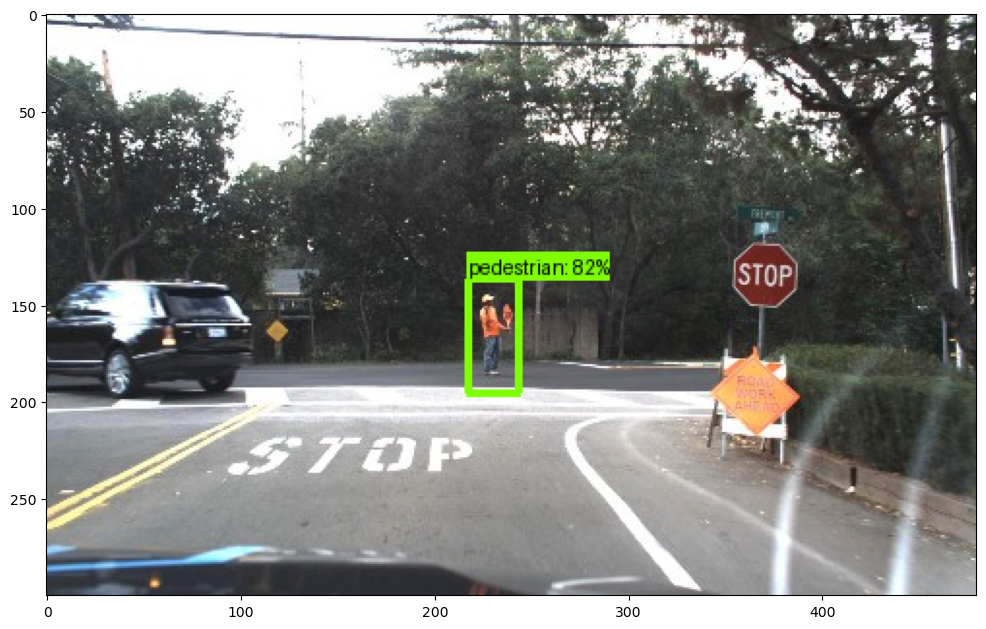

In [66]:
# Test prediction
img = cv2.imread('../data/interim/object_detection/images/1478900584619750605.jpg')
image_np = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Convert input image to tensor
input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32
)

# Use the model to get detections
detections = detect(input_tensor)
# Class pedestrian, ignore class 0
label_id_offset = 1
image_np_with_detections = image_np.copy()

# Visualize predictions
viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections, # Image
    detections['detection_boxes'][0].numpy(), # Bounding boxes
    (detections['detection_classes'][0].numpy() + label_id_offset).astype(int), # Classes
    detections['detection_scores'][0].numpy(), # Scores of detections
    category_index, # Category index: 0, 1
    use_normalized_coordinates=True,
    min_score_thresh=0.7
)

plt.figure(figsize=(12, 16))
plt.imshow(image_np_with_detections)
plt.show()